# The main aim of this Project is to predict the price of the Banglore House using their features.

In [1]:
# Importing the libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
# Load the dataset 

In [4]:
df = pd.read_csv("Bengaluru_House_Data.csv")
df

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00
...,...,...,...,...,...,...,...,...,...
13315,Built-up Area,Ready To Move,Whitefield,5 Bedroom,ArsiaEx,3453,4.0,0.0,231.00
13316,Super built-up Area,Ready To Move,Richards Town,4 BHK,NaN,3600,5.0,NaN,400.00
13317,Built-up Area,Ready To Move,Raja Rajeshwari Nagar,2 BHK,Mahla T,1141,2.0,1.0,60.00
13318,Super built-up Area,18-Jun,Padmanabhanagar,4 BHK,SollyCl,4689,4.0,1.0,488.00


In [5]:
# Getting the top 5 rows 

In [6]:
df.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


In [7]:
# Getting the bottom 5 rows

In [8]:
df.tail()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
13315,Built-up Area,Ready To Move,Whitefield,5 Bedroom,ArsiaEx,3453,4.0,0.0,231.0
13316,Super built-up Area,Ready To Move,Richards Town,4 BHK,NaN,3600,5.0,NaN,400.0
13317,Built-up Area,Ready To Move,Raja Rajeshwari Nagar,2 BHK,Mahla T,1141,2.0,1.0,60.0
13318,Super built-up Area,18-Jun,Padmanabhanagar,4 BHK,SollyCl,4689,4.0,1.0,488.0
13319,Super built-up Area,Ready To Move,Doddathoguru,1 BHK,NaN,550,1.0,1.0,17.0


In [9]:
# Getting dimensions of dataframe

df.shape

(13320, 9)

In [10]:
# There are 13320 rows and 9 columns

# Exploratory Data Analysis

In [11]:
# Information about the dataframe

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13320 entries, 0 to 13319
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   area_type     13320 non-null  object 
 1   availability  13320 non-null  object 
 2   location      13319 non-null  object 
 3   size          13304 non-null  object 
 4   society       7818 non-null   object 
 5   total_sqft    13320 non-null  object 
 6   bath          13247 non-null  float64
 7   balcony       12711 non-null  float64
 8   price         13320 non-null  float64
dtypes: float64(3), object(6)
memory usage: 936.7+ KB


In [12]:
# So, There are 3 numerical features :- bath, balcony and price.
# Categorical features :- area_type, availability, location, size, society, total_sqft
# Target:- Price prediction

In [13]:
# Description of dataframe

df.describe()

,bath,balcony,price
count,13247.000000,12711.000000,13320.000000
mean,2.692610,1.584376,112.565627
std,1.341458,0.817263,148.971674
min,1.000000,0.000000,8.000000
25%,2.000000,1.000000,50.000000
50%,2.000000,2.000000,72.000000
75%,3.000000,2.000000,120.000000
max,40.000000,3.000000,3600.000000


In [14]:
# Huge difference between 3 quartile(75%) and the max value in the price feature.

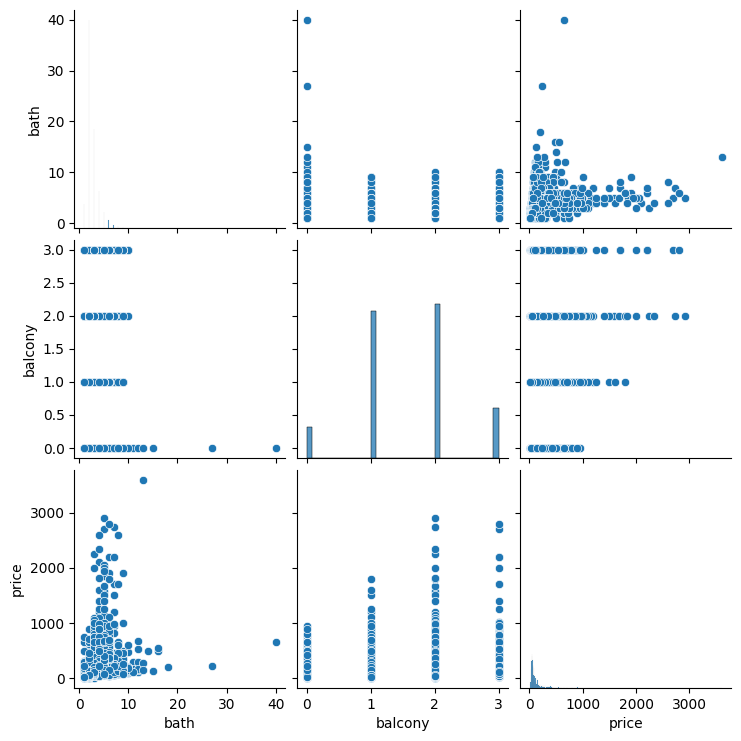

In [15]:
sns.pairplot(df)

In [16]:
# bath and price have linear correlation with few outliers.

In [17]:
# Finding the unique values

def value_count(df):
    for i in df.columns:
        print(df[i].value_counts())

value_count(df)

area_type
Super built-up  Area    8790
Built-up  Area          2418
Plot  Area              2025
Carpet  Area              87
Name: count, dtype: int64
availability
Ready To Move    10581
18-Dec             307
18-May             295
18-Apr             271
18-Aug             200
                 ...  
15-Aug               1
17-Jan               1
16-Nov               1
16-Jan               1
14-Jul               1
Name: count, Length: 81, dtype: int64
location
Whitefield                        540
Sarjapur  Road                    399
Electronic City                   302
Kanakpura Road                    273
Thanisandra                       234
                                 ... 
Bapuji Layout                       1
1st Stage Radha Krishna Layout      1
BEML Layout 5th stage               1
singapura paradise                  1
Abshot Layout                       1
Name: count, Length: 1305, dtype: int64
size
2 BHK         5199
3 BHK         4310
4 Bedroom      826
4 BHK          

In [18]:
#Correlatin between the numerical features
num_vars=['bath','balcony','price']
correlation= df[num_vars].corr()
correlation

,bath,balcony,price
bath,1.000000,0.204201,0.456345
balcony,0.204201,1.000000,0.120355
price,0.456345,0.120355,1.000000


<Figure size 600x300 with 0 Axes>

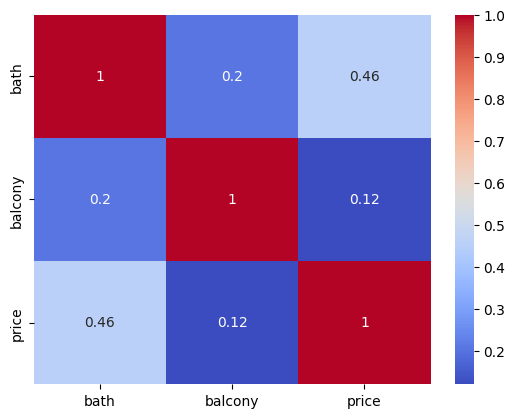

<Figure size 600x300 with 0 Axes>

In [19]:
sns.heatmap(correlation, cmap='coolwarm' ,annot=True)
plt.figure(figsize=(6,3))

# Data cleaning

In [20]:
df.isnull()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False
2,False,False,False,False,True,False,False,False,False
3,False,False,False,False,False,False,False,False,False
4,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...
13315,False,False,False,False,False,False,False,False,False
13316,False,False,False,False,True,False,False,True,False
13317,False,False,False,False,False,False,False,False,False
13318,False,False,False,False,False,False,False,False,False


In [21]:
# Sum of all null values present in each feature

df.isnull().sum()

area_type          0
availability       0
location           1
size              16
society         5502
total_sqft         0
bath              73
balcony          609
price              0
dtype: int64

In [22]:
# Sum of null values present in the dataframe

df.isnull().sum().sum()

6201

In [23]:
# % of missing values in dataframe

df.isnull().mean()*100

area_type        0.000000
availability     0.000000
location         0.007508
size             0.120120
society         41.306306
total_sqft       0.000000
bath             0.548048
balcony          4.572072
price            0.000000
dtype: float64

In [24]:
# We can see Society has 41.306306 null values so , it should be dropped.

<Figure size 1600x900 with 0 Axes>

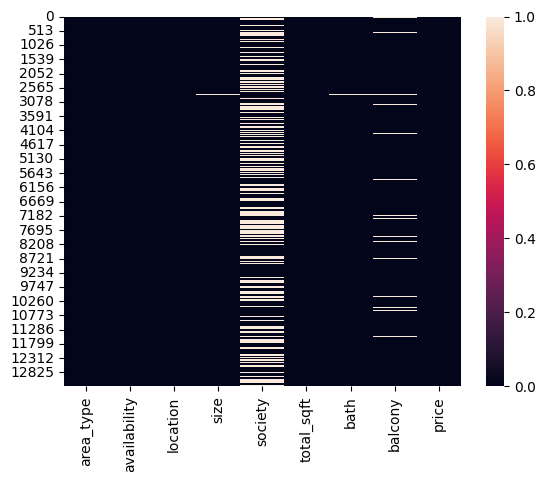

<Figure size 1600x900 with 0 Axes>

In [25]:
# Visualize missing value using heatmap

sns.heatmap(df.isnull())
plt.figure(figsize=(16,9))

In [26]:
# Dropping society column as it contain 41% null values.

df1=df.drop('society',axis=1)
df1.head(5)

,area_type,availability,location,size,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,1200,2.0,1.0,51.00


In [27]:
# Filling the missing values in balcony column.

df1['balcony'] = df1['balcony'].fillna(df1['balcony'].mean())
df1.head(5)

,area_type,availability,location,size,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,1200,2.0,1.0,51.00


In [28]:
df1['balcony'].isnull().sum()

0

In [29]:
df1.isnull().sum()

area_type        0
availability     0
location         1
size            16
total_sqft       0
bath            73
balcony          0
price            0
dtype: int64

In [30]:
# dropping null values from the dataframe df1

df2=df1.dropna()
df2.isnull().sum()

area_type       0
availability    0
location        0
size            0
total_sqft      0
bath            0
balcony         0
price           0
dtype: int64

In [31]:
df2.shape

(13246, 8)

In [32]:
df2.head(6)

,area_type,availability,location,size,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,1200,2.0,1.0,51.00
5,Super built-up Area,Ready To Move,Whitefield,2 BHK,1170,2.0,1.0,38.00


# Feature Engineering

In [33]:
pd.set_option('display.max_columns',None)
pd.set_option("display.max_rows",None)

In [34]:
# Converting total_sqft categorical feature into Numeric feature

df2['total_sqft'].value_counts()

#best strategy is to convert it into number by spliting it

total_sqft
1200                 843
1100                 221
1500                 204
2400                 195
600                  180
1000                 172
1350                 132
1050                 123
1300                 117
1250                 114
900                  112
1400                 108
1800                 104
1150                 101
1600                 100
1140                  91
2000                  82
1450                  70
1650                  69
800                   67
3000                  66
1075                  66
1020                  63
2500                  62
1125                  60
1160                  60
1550                  60
950                   59
1700                  58
1180                  58
1260                  57
1255                  56
1080                  55
1220                  55
1070                  53
750                   52
700                   52
4000                  48
1175                  48
1225          

In [35]:
total_sqft_int = []
for str_val in df2['total_sqft']:
    try:
        total_sqft_int.append(float(str_val))
    except:
        try:
            temp = []
            temp = str_val.split('-')
            total_sqft_int.append(float(temp[0]) + float(temp[-1]))/2
        except:
            total_sqft_int.append(np.nan)

In [36]:
df3 = df2.reset_index(drop=True)
df3.head(6)

,area_type,availability,location,size,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,1200,2.0,1.0,51.00
5,Super built-up Area,Ready To Move,Whitefield,2 BHK,1170,2.0,1.0,38.00


In [37]:
df4=pd.DataFrame({'total_sqft_int':total_sqft_int})
df4

,total_sqft_int
0,1056.00
1,2600.00
2,1440.00
3,1521.00
4,1200.00
5,1170.00
6,2732.00
7,3300.00
8,1310.00
9,1020.00


In [38]:
df5 = df3.join(df4)
df5

,area_type,availability,location,size,total_sqft,bath,balcony,price,total_sqft_int
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,1056,2.0,1.000000,39.070,1056.00
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,2600,5.0,3.000000,120.000,2600.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,1440,2.0,3.000000,62.000,1440.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,1521,3.0,1.000000,95.000,1521.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,1200,2.0,1.000000,51.000,1200.00
5,Super built-up Area,Ready To Move,Whitefield,2 BHK,1170,2.0,1.000000,38.000,1170.00
6,Super built-up Area,18-May,Old Airport Road,4 BHK,2732,4.0,1.584376,204.000,2732.00
7,Super built-up Area,Ready To Move,Rajaji Nagar,4 BHK,3300,4.0,1.584376,600.000,3300.00
8,Super built-up Area,Ready To Move,Marathahalli,3 BHK,1310,3.0,1.000000,63.250,1310.00
9,Plot Area,Ready To Move,Gandhi Bazar,6 Bedroom,1020,6.0,1.584376,370.000,1020.00


In [39]:
df5.shape

(13246, 9)

In [40]:
df5.head()

,area_type,availability,location,size,total_sqft,bath,balcony,price,total_sqft_int
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,1056,2.0,1.0,39.07,1056.0
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,2600,5.0,3.0,120.00,2600.0
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,1440,2.0,3.0,62.00,1440.0
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,1521,3.0,1.0,95.00,1521.0
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,1200,2.0,1.0,51.00,1200.0


In [41]:
df5.tail()

,area_type,availability,location,size,total_sqft,bath,balcony,price,total_sqft_int
13241,Built-up Area,Ready To Move,Whitefield,5 Bedroom,3453,4.0,0.000000,231.0,1464.0
13242,Super built-up Area,Ready To Move,Richards Town,4 BHK,3600,5.0,1.584376,400.0,1295.0
13243,Built-up Area,Ready To Move,Raja Rajeshwari Nagar,2 BHK,1141,2.0,1.000000,60.0,1012.0
13244,Super built-up Area,18-Jun,Padmanabhanagar,4 BHK,4689,4.0,1.000000,488.0,1000.0
13245,Super built-up Area,Ready To Move,Doddathoguru,1 BHK,550,1.0,1.000000,17.0,1010.0


In [42]:
df5.isnull().sum()

area_type           0
availability        0
location            0
size                0
total_sqft          0
bath                0
balcony             0
price               0
total_sqft_int    188
dtype: int64

In [43]:
df6 = df5.dropna()
df6.shape

(13058, 9)

In [44]:
df6.isnull().sum()

area_type         0
availability      0
location          0
size              0
total_sqft        0
bath              0
balcony           0
price             0
total_sqft_int    0
dtype: int64

In [45]:
df6.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13058 entries, 0 to 13245
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   area_type       13058 non-null  object 
 1   availability    13058 non-null  object 
 2   location        13058 non-null  object 
 3   size            13058 non-null  object 
 4   total_sqft      13058 non-null  object 
 5   bath            13058 non-null  float64
 6   balcony         13058 non-null  float64
 7   price           13058 non-null  float64
 8   total_sqft_int  13058 non-null  float64
dtypes: float64(4), object(5)
memory usage: 1020.2+ KB


# Work on--size --feature 

In [46]:
df6['size'].value_counts()
# size feature shows the number of rooms 
# In this we want only int values not string so working for that in the next line.

size
2 BHK         5129
3 BHK         4224
4 Bedroom      811
4 BHK          567
3 Bedroom      537
1 BHK          523
2 Bedroom      322
5 Bedroom      294
6 Bedroom      188
1 Bedroom      102
7 Bedroom       81
8 Bedroom       80
5 BHK           57
9 Bedroom       45
6 BHK           29
7 BHK           17
1 RK            13
10 Bedroom      12
9 BHK            8
8 BHK            5
11 BHK           2
11 Bedroom       2
10 BHK           2
14 BHK           1
13 BHK           1
12 Bedroom       1
27 BHK           1
43 Bedroom       1
16 BHK           1
19 BHK           1
18 Bedroom       1
Name: count, dtype: int64

In [47]:
size_int = []
for str_val in df6['size']:
    temp = []
    temp = str_val.split(' ')
    #print(temp)
    try:
        size_int.append(int(temp[0]))
    except:
        size_int.append(np.nan)
        print("Noice = ",str_val)

In [48]:
df6.reset_index(drop= True)
df6.head()

,area_type,availability,location,size,total_sqft,bath,balcony,price,total_sqft_int
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,1056,2.0,1.0,39.07,1056.0
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,2600,5.0,3.0,120.00,2600.0
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,1440,2.0,3.0,62.00,1440.0
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,1521,3.0,1.0,95.00,1521.0
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,1200,2.0,1.0,51.00,1200.0


In [49]:
df7 = df6.join(pd.DataFrame({"bhk" : size_int}))
df7.head()

,area_type,availability,location,size,total_sqft,bath,balcony,price,total_sqft_int,bhk
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,1056,2.0,1.0,39.07,1056.0,2.0
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,2600,5.0,3.0,120.00,2600.0,4.0
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,1440,2.0,3.0,62.00,1440.0,3.0
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,1521,3.0,1.0,95.00,1521.0,3.0
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,1200,2.0,1.0,51.00,1200.0,2.0


In [50]:
df7.tail()

,area_type,availability,location,size,total_sqft,bath,balcony,price,total_sqft_int,bhk
13241,Built-up Area,Ready To Move,Whitefield,5 Bedroom,3453,4.0,0.000000,231.0,1464.0,NaN
13242,Super built-up Area,Ready To Move,Richards Town,4 BHK,3600,5.0,1.584376,400.0,1295.0,NaN
13243,Built-up Area,Ready To Move,Raja Rajeshwari Nagar,2 BHK,1141,2.0,1.000000,60.0,1012.0,NaN
13244,Super built-up Area,18-Jun,Padmanabhanagar,4 BHK,4689,4.0,1.000000,488.0,1000.0,NaN
13245,Super built-up Area,Ready To Move,Doddathoguru,1 BHK,550,1.0,1.000000,17.0,1010.0,NaN


In [51]:
df7.shape

(13058, 10)

# Outliers detection and removal

******* bath *******


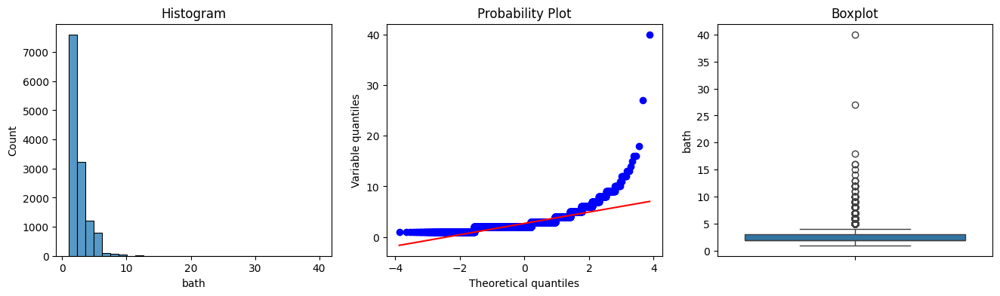

******* balcony *******


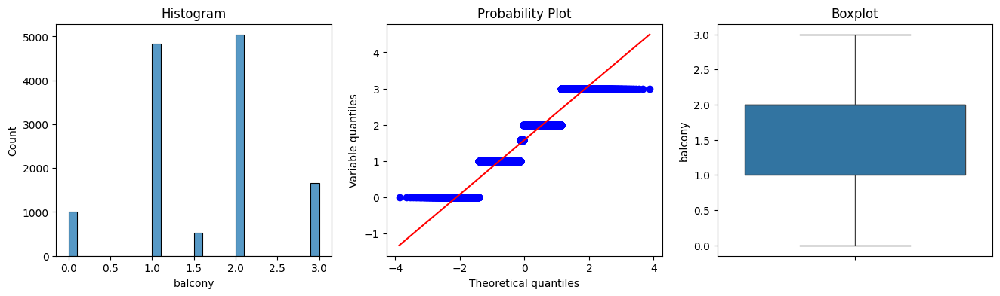

******* total_sqft_int *******


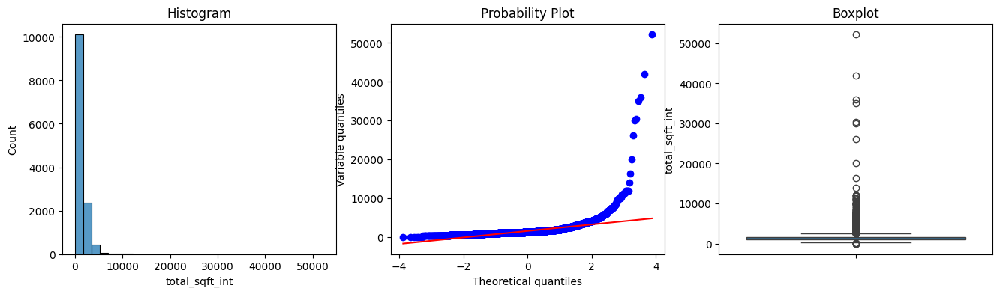

******* bhk *******


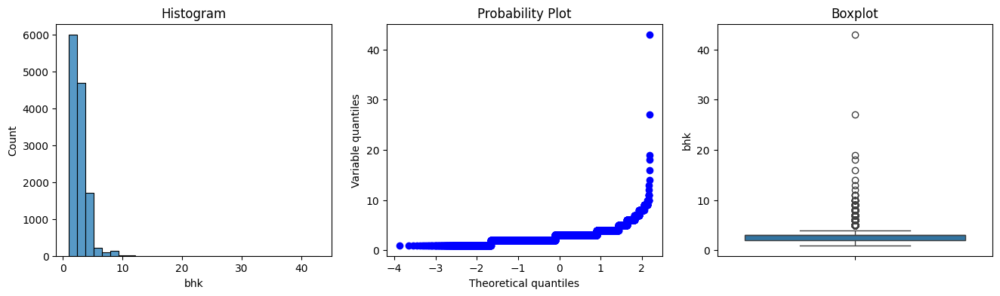

******* price *******


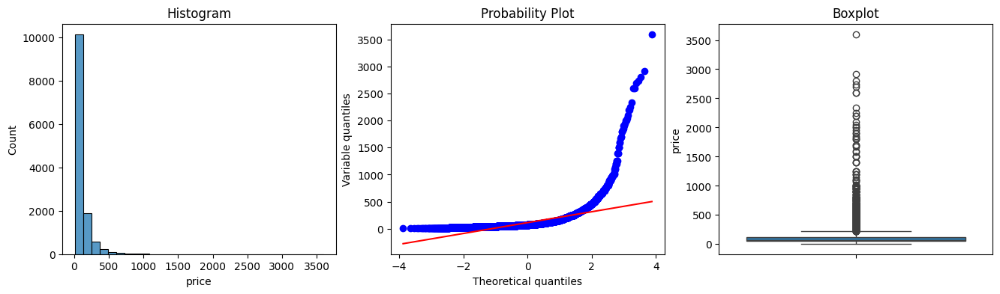

In [52]:
# function to create histogram, Q-Q plot and boxplot

# for Q-Q plots
import scipy.stats as stats
# Defining the function
def diagnostic_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

# calling the function
num_var = [ "bath", "balcony", "total_sqft_int", "bhk", "price" ]
for var in num_var:
  print("******* {} *******".format(var))
  diagnostic_plots(df7, var)

# here we observe outlier using histogram,, qq plot and boxplot 

In [53]:
# We consider the minimum area for 1 bhk is 350 .
df7[df7['total_sqft_int']/df7['bhk']<350]

,area_type,availability,location,size,total_sqft,bath,balcony,price,total_sqft_int,bhk
9,Plot Area,Ready To Move,Gandhi Bazar,6 Bedroom,1020,6.0,1.584376,370.000,1020.00,6.0
26,Super built-up Area,Ready To Move,Electronic City,2 BHK,660,1.0,1.000000,23.100,660.00,2.0
29,Super built-up Area,Ready To Move,Electronic City,3 BHK,1025,2.0,1.000000,47.000,1025.00,3.0
36,Super built-up Area,Ready To Move,Electronics City Phase 1,2 BHK,1070,2.0,1.000000,45.500,700.00,3.0
43,Plot Area,Ready To Move,Yelahanka,1 Bedroom,660,1.0,0.000000,48.000,600.00,2.0
44,Super built-up Area,19-Sep,Kanakpura Road,2 BHK,1330.74,2.0,2.000000,91.790,660.00,8.0
46,Super built-up Area,Ready To Move,Doddathoguru,2 BHK,970,2.0,0.000000,33.000,600.00,2.0
50,Super built-up Area,Ready To Move,Adarsh Nagar,2 BHK,1270,2.0,1.000000,50.000,869.00,3.0
56,Super built-up Area,Ready To Move,Ramakrishnappa Layout,2 BHK,1500,2.0,2.000000,185.000,1200.00,6.0
66,Super built-up Area,Ready To Move,Marathahalli,2 BHK,1220,2.0,1.000000,57.000,1140.00,8.0


In [54]:
# if 1 BHK total_sqft are < 350 then we ae going to remove them
df8 = df7[~(df7['total_sqft_int']/df7['bhk'] < 350)] 
df8.head()

,area_type,availability,location,size,total_sqft,bath,balcony,price,total_sqft_int,bhk
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,1056,2.0,1.0,39.07,1056.0,2.0
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,2600,5.0,3.0,120.00,2600.0,4.0
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,1440,2.0,3.0,62.00,1440.0,3.0
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,1521,3.0,1.0,95.00,1521.0,3.0
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,1200,2.0,1.0,51.00,1200.0,2.0


In [55]:
df8.shape

(10407, 10)

In [56]:
# create new feature that is price per square foot, it help to find the outliers
#price in lakh so convert into rupees and then divide by total_sqft_int

df8 = df8.assign(price_per_sqft=lambda x: x['price'] * 100000 / x['total_sqft_int'])
df8.head()

,area_type,availability,location,size,total_sqft,bath,balcony,price,total_sqft_int,bhk,price_per_sqft
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,1056,2.0,1.0,39.07,1056.0,2.0,3699.810606
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,2600,5.0,3.0,120.00,2600.0,4.0,4615.384615
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,1440,2.0,3.0,62.00,1440.0,3.0,4305.555556
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,1521,3.0,1.0,95.00,1521.0,3.0,6245.890861
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,1200,2.0,1.0,51.00,1200.0,2.0,4250.000000


In [57]:
df8['price_per_sqft'].describe()

count     10407.000000
mean       7824.086698
std       11503.211340
min         119.047619
25%        3119.413316
50%        4934.210526
75%        8358.209286
max      283464.566929
Name: price_per_sqft, dtype: float64

In [58]:
# Removing outliers using help of 'price_per_sqft'  taking std and mean per location.

def remove_pps_outliers(df):
  df_out = pd.DataFrame()
    
  for key, subdf in df.groupby('location'):
    m=np.mean(subdf.price_per_sqft)
    st=np.std(subdf.price_per_sqft)
    reduced_df = subdf[(subdf.price_per_sqft>(m-st))&(subdf.price_per_sqft<=(m+st))]
    df_out = pd.concat([df_out, reduced_df], ignore_index = True)
  return df_out

df9 = remove_pps_outliers(df8)
df9.shape

(7729, 11)

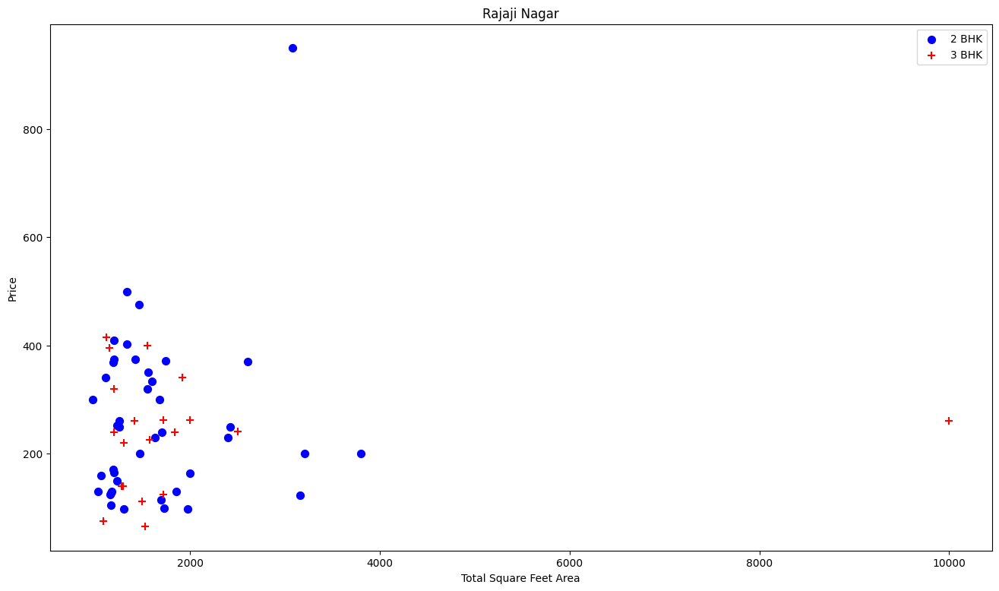

In [59]:
def plot_scatter_chart(df,location):
    
  bhk2 = df[(df.location==location) & (df.bhk==2)]
  bhk3 = df[(df.location==location) & (df.bhk==3)]
    
  plt.figure(figsize=(16,9))
  plt.scatter(bhk2.total_sqft_int, bhk2.price, color='Blue', label='2 BHK', s=50)
  plt.scatter(bhk3.total_sqft_int, bhk3.price, color='Red', label='3 BHK', s=50, marker="+")
  plt.xlabel("Total Square Feet Area")
  plt.ylabel("Price")
  plt.title(location)
  plt.legend()

plot_scatter_chart(df9, "Rajaji Nagar")

# In below scatterplot-we observe that at same location price of 2 bhk house is greater than 3 bhk, So, it is an outlier.

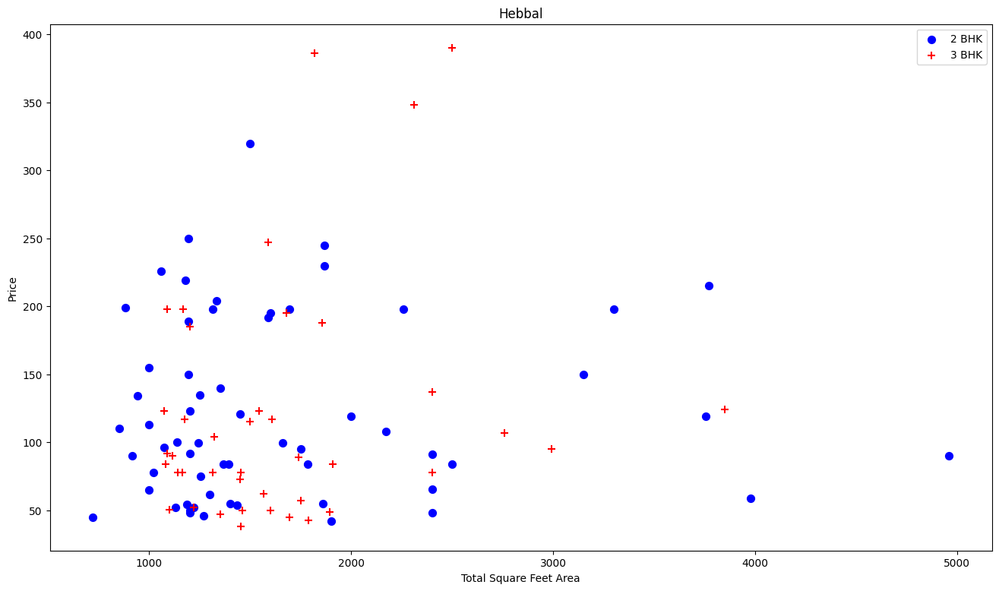

In [60]:
plot_scatter_chart(df9, "Hebbal")
# In below scatterplot, we observe that at same location price of 3 bhk house is less than 2 bhk. So it is an outlier.

In [61]:
# Removing BHK outliers

def remove_bhk_outliers(df):
  exclude_indices = np.array([])
  for location, location_df in df.groupby('location'):
    bhk_stats = {}
    for bhk, bhk_df in location_df.groupby('bhk'):
      bhk_stats[bhk]={
          'mean':np.mean(bhk_df.price_per_sqft),
          'std':np.std(bhk_df.price_per_sqft),
          'count':bhk_df.shape[0]}
    for bhk, bhk_df in location_df.groupby('bhk'):
      stats=bhk_stats.get(bhk-1)
      if stats and stats['count']>5:
        exclude_indices = np.append(exclude_indices, bhk_df[bhk_df.price_per_sqft<(stats['mean'])].index.values)
  return df.drop(exclude_indices, axis='index')

df10 = remove_bhk_outliers(df9)
df10.shape

(5572, 11)

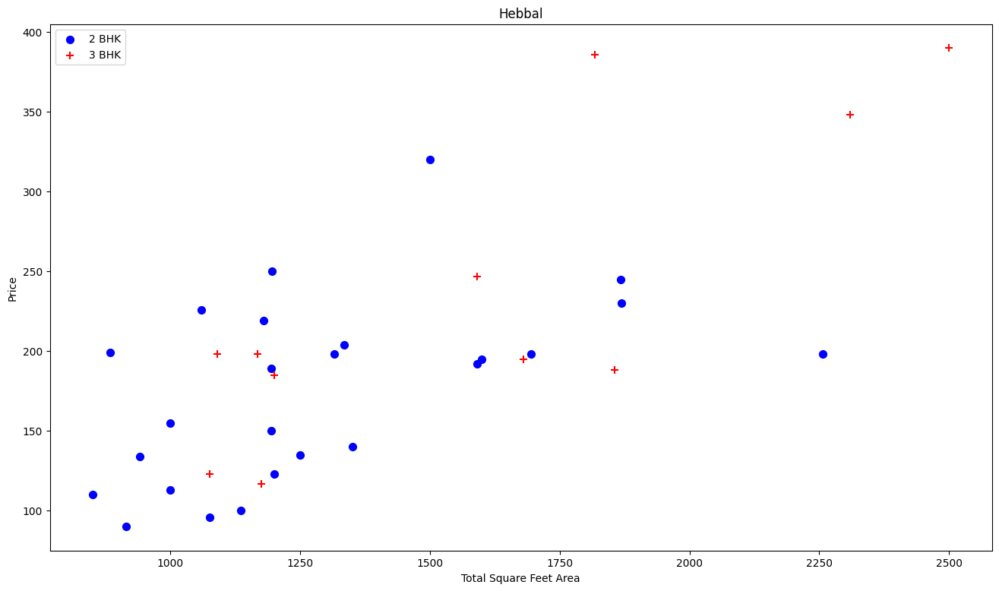

In [62]:
plot_scatter_chart(df10, "Hebbal")
# In below scatter plot most of the red data point are removed fron blue data points.

# Outliers removal using -- 'bath' -- feature.

In [63]:
df10['bath'].unique()

array([ 3.,  2.,  1.,  5.,  6., 10.,  4.,  8., 12.,  7.,  9., 11.])

In [64]:
df10[df10['bath'] > df10.bhk+2]

,area_type,availability,location,size,total_sqft,bath,balcony,price,total_sqft_int,bhk,price_per_sqft
14,Plot Area,Ready To Move,1st Block HBR Layout,5 Bedroom,2500,6.0,3.000000,500.0,2060.00,3.0,24271.844660
16,Plot Area,Ready To Move,1st Block HRBR Layout,10 Bedroom,2416,10.0,1.584376,600.0,3800.00,3.0,15789.473684
23,Plot Area,Ready To Move,1st Block Jayanagar,8 Bedroom,700,4.0,1.584376,104.0,4000.00,1.0,2600.000000
28,Super built-up Area,Ready To Move,1st Block Koramangala,4 BHK,3000,5.0,3.000000,500.0,1890.00,2.0,26455.026455
51,Plot Area,Ready To Move,2nd Block Hrbr Layout,4 Bedroom,1050,6.0,1.000000,74.0,4000.00,3.0,1850.000000
54,Plot Area,Ready To Move,2nd Phase JP Nagar,8 Bedroom,1350,8.0,2.000000,185.0,1200.00,3.0,15416.666667
75,Plot Area,Ready To Move,2nd Stage Nagarbhavi,3 Bedroom,600,5.0,1.000000,135.0,1420.00,2.0,9507.042254
77,Plot Area,Ready To Move,2nd Stage Nagarbhavi,5 Bedroom,1200,4.0,2.000000,240.0,1691.00,1.0,14192.785334
91,Super built-up Area,Ready To Move,4th Block Koramangala,4 BHK,3400,6.0,1.584376,420.0,2266.00,3.0,18534.863195
92,Built-up Area,Ready To Move,4th Block Koramangala,4 Bedroom,2400,5.0,3.000000,180.0,1150.00,2.0,15652.173913


In [65]:
# here we are considering data only total no. of bathroom =  bhk + 1

df11 = df10[df10.bath < df10.bhk+2]
df11.head(7)

,area_type,availability,location,size,total_sqft,bath,balcony,price,total_sqft_int,bhk,price_per_sqft
0,Built-up Area,Ready To Move,Devarabeesana Halli,3 BHK,1750,3.0,3.0,149.0,1160.0,2.0,12844.827586
1,Super built-up Area,Ready To Move,Devarabeesana Halli,3 BHK,1670,3.0,2.0,160.0,1500.0,2.0,10666.666667
2,Super built-up Area,18-May,Devarachikkanahalli,3 BHK,1250,2.0,3.0,44.0,1034.0,2.0,4255.319149
3,Plot Area,Ready To Move,Devarachikkanahalli,2 Bedroom,1200,2.0,2.0,83.0,1570.0,2.0,5286.624204
4,Super built-up Area,Ready To Move,Devarachikkanahalli,2 BHK,1230,2.0,1.0,58.0,1500.0,4.0,3866.666667
5,Built-up Area,Ready To Move,Devarachikkanahalli,2 BHK,1116,2.0,1.0,47.0,1220.0,2.0,3852.459016
6,Super built-up Area,Ready To Move,Devarachikkanahalli,2 BHK,991,2.0,2.0,40.0,1276.0,2.0,3134.796238


In [66]:
df11.shape

(4752, 11)

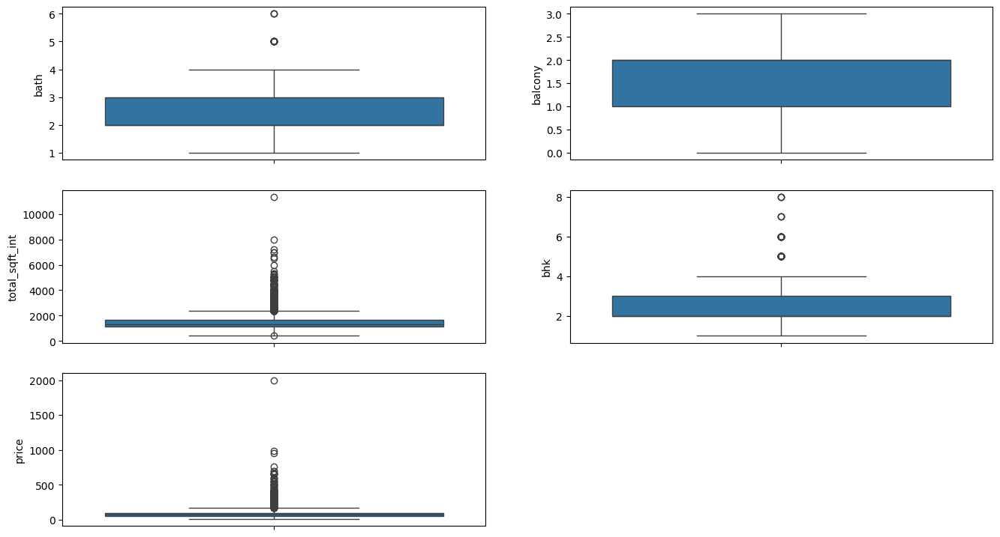

In [67]:
plt.figure(figsize=(16,9))

for i,var in enumerate(num_var):
  plt.subplot(3,2,i+1)
  sns.boxplot(df11[var])

In [68]:
# Dropping the categorical variables
df12 = df11.drop(['area_type', 'availability',"location","size","total_sqft"], axis =1)
df12.head()

,bath,balcony,price,total_sqft_int,bhk,price_per_sqft
0,3.0,3.0,149.0,1160.0,2.0,12844.827586
1,3.0,2.0,160.0,1500.0,2.0,10666.666667
2,2.0,3.0,44.0,1034.0,2.0,4255.319149
3,2.0,2.0,83.0,1570.0,2.0,5286.624204
4,2.0,1.0,58.0,1500.0,4.0,3866.666667


In [69]:
df12.to_csv("Clean_data.csv",index = False)

# Categorical Variable encoding

In [70]:
df13 = df11.drop(['size', 'total_sqft'],axis=1)
df13.head()

,area_type,availability,location,bath,balcony,price,total_sqft_int,bhk,price_per_sqft
0,Built-up Area,Ready To Move,Devarabeesana Halli,3.0,3.0,149.0,1160.0,2.0,12844.827586
1,Super built-up Area,Ready To Move,Devarabeesana Halli,3.0,2.0,160.0,1500.0,2.0,10666.666667
2,Super built-up Area,18-May,Devarachikkanahalli,2.0,3.0,44.0,1034.0,2.0,4255.319149
3,Plot Area,Ready To Move,Devarachikkanahalli,2.0,2.0,83.0,1570.0,2.0,5286.624204
4,Super built-up Area,Ready To Move,Devarachikkanahalli,2.0,1.0,58.0,1500.0,4.0,3866.666667


In [71]:
df14 = pd.get_dummies(df13,drop_first=True,columns =['area_type','availability','location'])
df14.head()

,bath,balcony,price,total_sqft_int,bhk,price_per_sqft,area_type_Carpet Area,area_type_Plot Area,area_type_Super built-up Area,availability_16-Dec,availability_16-Jul,availability_16-Oct,availability_16-Sep,availability_17-Apr,availability_17-Aug,availability_17-Dec,availability_17-Jul,availability_17-Jun,availability_17-Mar,availability_17-May,availability_17-Nov,availability_17-Oct,availability_17-Sep,availability_18-Apr,availability_18-Aug,availability_18-Dec,availability_18-Feb,availability_18-Jan,availability_18-Jul,availability_18-Jun,availability_18-Mar,availability_18-May,availability_18-Nov,availability_18-Oct,availability_18-Sep,availability_19-Apr,availability_19-Aug,availability_19-Dec,availability_19-Feb,availability_19-Jan,availability_19-Jul,availability_19-Jun,availability_19-Mar,availability_19-May,availability_19-Nov,availability_19-Oct,availability_19-Sep,availability_20-Apr,availability_20-Aug,availability_20-Dec,availability_20-Jan,availability_20-Jun,availability_20-Mar,availability_20-Nov,availability_20-Oct,availability_20-Sep,availability_21-Aug,availability_21-Dec,availability_21-Feb,availability_21-Jan,availability_21-Jul,availability_21-Jun,availability_21-Mar,availability_21-May,availability_21-Nov,availability_21-Oct,availability_21-Sep,availability_22-Dec,availability_22-Jan,availability_22-Jun,availability_22-Mar,availability_22-May,availability_Ready To Move,location_ Devarachikkanahalli,location_ Mysore Highway,location_ Rachenahalli,location_ Thanisandra,location_1st Block HRBR Layout,location_1st Block Jayanagar,location_1st Block Koramangala,location_1st Phase JP Nagar,location_1st Stage Indira Nagar,location_2nd Block Bel Layout,location_2nd Block Hrbr Layout,location_2nd Block Koramangala,location_2nd Phase JP Nagar,location_2nd Phase Judicial Layout,location_2nd Stage Arekere Mico Layout,location_2nd Stage Nagarbhavi,location_3rd Block Hrbr Layout,location_3rd Block Jayanagar,location_3rd Block Koramangala,location_4th Block Jayanagar,location_4th Block Koramangala,location_4th Phase JP Nagar,location_4th T block Jayanagar,location_5th Block Hbr Layout,location_5th Block Jayanagar,location_5th Phase JP Nagar,location_5th Stage BEML Layout,location_6th Phase JP Nagar,location_6th block Koramangala,location_7th Block Jayanagar,location_7th Phase JP Nagar,location_8th Block Jayanagar,location_8th Phase JP Nagar,location_8th block Koramangala,location_9th Block Jayanagar,location_9th Phase JP Nagar,location_A Narayanapura,location_AECS Layout,location_AGS Layout,location_AMS Layout,location_Abbaiah Reddy Layout,location_Abbigere,location_Agrahara Dasarahalli,location_Akshaya Nagar,location_Akshaya Vana,location_Akshayanagara East,location_Akshya Nagar,location_Alfa Garden Layout,location_Alur,location_Amam Enclave Layout,location_Ambalipura,location_Ambedkar Colony,location_Ambedkar Nagar,location_Amblipura,location_Amruthahalli,location_Amruthnagar,location_Anand Nagar,location_Anand nagar,location_Anandapura,location_Anantapura,location_Ananth Nagar,location_Andrahalli,location_Anekal,location_Anjanapura,location_Anjappa Layout,location_Ankappa Layout,location_Anugrah Layout,location_Anwar Layout,location_Ardendale,location_Arehalli,location_Arekere,location_Arishinakunte,location_Ashirvad Colony,location_Ashwath Nagar,location_Ashwathnagar,location_Ashwini layout,location_Atmananda Colony,location_Attibele,location_Attur Layout,location_Austin Town,location_Avalahalli,location_Ayappa Nagar,location_B Narayanapura,location_BCMC Layout,location_BEL Road,location_BEML Layout,location_BSM Extension,location_BTM 1st Stage,location_BTM 2nd Stage,location_BTM 4th Stage,location_BTM Layout,location_Baba Nagar,location_Babusapalaya,location_Badavala Nagar,location_Bagalakunte,location_Bagalur,location_Bagalur Main Road,location_Balagere,location_Banagiri Nagar,location_Banashankari,location_Banashankari Stage II,location_Banashankari Stage III,location_Banashankari Stage V,location_Banashankari Sta

In [72]:
df14.shape

(4752, 748)

In [73]:
df14.to_csv('one_encoded_data.csv', index=False)

# Work on -- area_type -- feature

In [74]:
df13['area_type'].value_counts()

area_type
Super built-up  Area    3435
Built-up  Area           843
Plot  Area               445
Carpet  Area              29
Name: count, dtype: int64

In [75]:
 # One hot encoding
df15 = df13.copy()

# appy One-Hot  encoding on 'area_type' feature
Categ= ["Super built-up  Area","Built-up  Area","Plot  Area"]
for cat_var in  Categ :
  df15[f"area_type{cat_var}"] = np.where(df15['area_type']==cat_var, 1,0)
    
df15.shape

(4752, 12)

In [76]:
df15.head()

,area_type,availability,location,bath,balcony,price,total_sqft_int,bhk,price_per_sqft,area_typeSuper built-up Area,area_typeBuilt-up Area,area_typePlot Area
0,Built-up Area,Ready To Move,Devarabeesana Halli,3.0,3.0,149.0,1160.0,2.0,12844.827586,0,1,0
1,Super built-up Area,Ready To Move,Devarabeesana Halli,3.0,2.0,160.0,1500.0,2.0,10666.666667,1,0,0
2,Super built-up Area,18-May,Devarachikkanahalli,2.0,3.0,44.0,1034.0,2.0,4255.319149,1,0,0
3,Plot Area,Ready To Move,Devarachikkanahalli,2.0,2.0,83.0,1570.0,2.0,5286.624204,0,0,1
4,Super built-up Area,Ready To Move,Devarachikkanahalli,2.0,1.0,58.0,1500.0,4.0,3866.666667,1,0,0


# Work on --availability-- feature

In [77]:
df5["availability"].value_counts()

availability
Ready To Move    10564
18-Dec             297
18-May             291
18-Apr             269
18-Aug             200
19-Dec             183
18-Jul             142
18-Mar             125
20-Dec              98
18-Jun              96
21-Dec              88
19-Mar              87
18-Feb              62
18-Nov              47
18-Jan              43
18-Sep              40
19-Jan              39
19-Jun              39
18-Oct              38
19-Jul              36
17-Dec              29
20-Jan              24
17-Oct              21
19-Sep              21
22-Jun              19
19-Aug              18
21-Jun              17
20-Aug              16
19-Apr              16
19-Oct              15
21-Mar              14
17-Jun              13
17-Nov              12
21-Jan              12
21-May              12
17-Jul              12
22-Dec              11
17-Sep              11
20-Jun              11
17-Aug               9
21-Jul               8
19-May               8
17-May               

In [78]:
df15["availability_Ready To Move"] = np.where(df15["availability"]=="Ready To Move",1,0)
df15.shape

(4752, 13)

In [79]:
df15.head()

,area_type,availability,location,bath,balcony,price,total_sqft_int,bhk,price_per_sqft,area_typeSuper built-up Area,area_typeBuilt-up Area,area_typePlot Area,availability_Ready To Move
0,Built-up Area,Ready To Move,Devarabeesana Halli,3.0,3.0,149.0,1160.0,2.0,12844.827586,0,1,0,1
1,Super built-up Area,Ready To Move,Devarabeesana Halli,3.0,2.0,160.0,1500.0,2.0,10666.666667,1,0,0,1
2,Super built-up Area,18-May,Devarachikkanahalli,2.0,3.0,44.0,1034.0,2.0,4255.319149,1,0,0,0
3,Plot Area,Ready To Move,Devarachikkanahalli,2.0,2.0,83.0,1570.0,2.0,5286.624204,0,0,1,1
4,Super built-up Area,Ready To Move,Devarachikkanahalli,2.0,1.0,58.0,1500.0,4.0,3866.666667,1,0,0,1


In [80]:
df15.tail()

,area_type,availability,location,bath,balcony,price,total_sqft_int,bhk,price_per_sqft,area_typeSuper built-up Area,area_typeBuilt-up Area,area_typePlot Area,availability_Ready To Move
7719,Super built-up Area,18-Aug,Yeshwanthpur,3.0,3.000000,108.00,1575.0,3.0,6857.142857,1,0,0,0
7722,Super built-up Area,Ready To Move,Yeshwanthpur,3.0,1.584376,92.13,1750.0,2.0,5264.571429,1,0,0,1
7726,Super built-up Area,Ready To Move,Yeshwanthpur Industrial Suburb,2.0,2.000000,120.00,1200.0,3.0,10000.000000,1,0,0,1
7727,Super built-up Area,Ready To Move,frazertown,3.0,2.000000,325.00,1464.0,2.0,22199.453552,1,0,0,1
7728,Super built-up Area,18-Nov,manyata park,2.0,1.000000,61.99,780.0,1.0,7947.435897,1,0,0,0


In [81]:
# Work on --location-- feature
location_value_count = df15['location'].value_counts()
location_value_count

location
Raja Rajeshwari Nagar                  84
7th Phase JP Nagar                     80
Whitefield                             80
Electronic City                        77
Thanisandra                            75
Kanakpura Road                         74
Sarjapur  Road                         71
Hennur Road                            70
Uttarahalli                            68
Haralur Road                           64
Yelahanka                              57
Chandapura                             55
Bellandur                              46
Marathahalli                           44
Koramangala                            40
Sarjapur                               38
Begur Road                             37
Varthur                                37
Jakkur                                 37
Kasavanhalli                           36
Hoodi                                  36
Banashankari                           35
Hormavu                                34
Kengeri                  

In [82]:
# Getting the locations which are present in dataset more than 20.
location_20 = location_value_count[location_value_count>=20].index
location_20

Index(['Raja Rajeshwari Nagar', '7th Phase JP Nagar', 'Whitefield',
       'Electronic City', 'Thanisandra', 'Kanakpura Road', 'Sarjapur  Road',
       'Hennur Road', 'Uttarahalli', 'Haralur Road', 'Yelahanka', 'Chandapura',
       'Bellandur', 'Marathahalli', 'Koramangala', 'Sarjapur', 'Begur Road',
       'Varthur', 'Jakkur', 'Kasavanhalli', 'Hoodi', 'Banashankari', 'Hormavu',
       'Kengeri', 'Hebbal', 'Electronics City Phase 1', 'Kothanur', 'JP Nagar',
       'Harlur', 'Ramamurthy Nagar', 'Rachenahalli',
       'Electronic City Phase II', 'Yeshwanthpur', 'KR Puram', 'Hosa Road',
       '8th Phase JP Nagar', 'TC Palaya', 'Nagarbhavi', 'Akshaya Nagar',
       'Ramagondanahalli', 'Indira Nagar', 'Hulimavu', 'Bisuvanahalli',
       'Kengeri Satellite Town', 'Bannerghatta Road', 'Old Madras Road',
       'Hennur', 'Budigere', 'Rajaji Nagar', 'Yelahanka New Town',
       'Kanakapura', 'CV Raman Nagar', 'HSR Layout', 'Mysore Road',
       'Jalahalli', 'Bommasandra'],
      dtype='object'

In [83]:
# One hot encoding 
df16 = df15.copy()
for cat_var in location_20:
    df16[f"location{cat_var}"] =  np.where(df16['location'] == cat_var,1,0)
df16.shape

(4752, 69)

In [84]:
df16.head()

,area_type,availability,location,bath,balcony,price,total_sqft_int,bhk,price_per_sqft,area_typeSuper built-up Area,area_typeBuilt-up Area,area_typePlot Area,availability_Ready To Move,locationRaja Rajeshwari Nagar,location7th Phase JP Nagar,locationWhitefield,locationElectronic City,locationThanisandra,locationKanakpura Road,locationSarjapur Road,locationHennur Road,locationUttarahalli,locationHaralur Road,locationYelahanka,locationChandapura,locationBellandur,locationMarathahalli,locationKoramangala,locationSarjapur,locationBegur Road,locationVarthur,locationJakkur,locationKasavanhalli,locationHoodi,locationBanashankari,locationHormavu,locationKengeri,locationHebbal,locationElectronics City Phase 1,locationKothanur,locationJP Nagar,locationHarlur,locationRamamurthy Nagar,locationRachenahalli,locationElectronic City Phase II,locationYeshwanthpur,locationKR Puram,locationHosa Road,location8th Phase JP Nagar,locationTC Palaya,locationNagarbhavi,locationAkshaya Nagar,locationRamagondanahalli,locationIndira Nagar,locationHulimavu,locationBisuvanahalli,locationKengeri Satellite Town,locationBannerghatta Road,locationOld Madras Road,locationHennur,locationBudigere,locationRajaji Nagar,locationYelahanka New Town,locationKanakapura,locationCV Raman Nagar,locationHSR Layout,locationMysore Road,locationJalahalli,locationBommasandra
0,Built-up Area,Ready To Move,Devarabeesana Halli,3.0,3.0,149.0,1160.0,2.0,12844.827586,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Super built-up Area,Ready To Move,Devarabeesana Halli,3.0,2.0,160.0,1500.0,2.0,10666.666667,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Super built-up Area,18-May,Devarachikkanahalli,2.0,3.0,44.0,1034.0,2.0,4255.319149,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Plot Area,Ready To Move,Devarachikkanahalli,2.0,2.0,83.0,1570.0,2.0,5286.624204,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Super built-up Area,Ready To Move,Devarachikkanahalli,2.0,1.0,58.0,1500.0,4.0,3866.666667,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [85]:
df16.tail()

,area_type,availability,location,bath,balcony,price,total_sqft_int,bhk,price_per_sqft,area_typeSuper built-up Area,area_typeBuilt-up Area,area_typePlot Area,availability_Ready To Move,locationRaja Rajeshwari Nagar,location7th Phase JP Nagar,locationWhitefield,locationElectronic City,locationThanisandra,locationKanakpura Road,locationSarjapur Road,locationHennur Road,locationUttarahalli,locationHaralur Road,locationYelahanka,locationChandapura,locationBellandur,locationMarathahalli,locationKoramangala,locationSarjapur,locationBegur Road,locationVarthur,locationJakkur,locationKasavanhalli,locationHoodi,locationBanashankari,locationHormavu,locationKengeri,locationHebbal,locationElectronics City Phase 1,locationKothanur,locationJP Nagar,locationHarlur,locationRamamurthy Nagar,locationRachenahalli,locationElectronic City Phase II,locationYeshwanthpur,locationKR Puram,locationHosa Road,location8th Phase JP Nagar,locationTC Palaya,locationNagarbhavi,locationAkshaya Nagar,locationRamagondanahalli,locationIndira Nagar,locationHulimavu,locationBisuvanahalli,locationKengeri Satellite Town,locationBannerghatta Road,locationOld Madras Road,locationHennur,locationBudigere,locationRajaji Nagar,locationYelahanka New Town,locationKanakapura,locationCV Raman Nagar,locationHSR Layout,locationMysore Road,locationJalahalli,locationBommasandra
7719,Super built-up Area,18-Aug,Yeshwanthpur,3.0,3.000000,108.00,1575.0,3.0,6857.142857,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7722,Super built-up Area,Ready To Move,Yeshwanthpur,3.0,1.584376,92.13,1750.0,2.0,5264.571429,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7726,Super built-up Area,Ready To Move,Yeshwanthpur Industrial Suburb,2.0,2.000000,120.00,1200.0,3.0,10000.000000,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7727,Super built-up Area,Ready To Move,frazertown,3.0,2.000000,325.00,1464.0,2.0,22199.453552,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7728,Super built-up Area,18-Nov,manyata park,2.0,1.000000,61.99,780.0,1.0,7947.435897,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [86]:
df17 = df16.drop(['area_type','availability','location'],axis=1)
df17.shape

(4752, 66)

In [87]:
df17.head()

,bath,balcony,price,total_sqft_int,bhk,price_per_sqft,area_typeSuper built-up Area,area_typeBuilt-up Area,area_typePlot Area,availability_Ready To Move,locationRaja Rajeshwari Nagar,location7th Phase JP Nagar,locationWhitefield,locationElectronic City,locationThanisandra,locationKanakpura Road,locationSarjapur Road,locationHennur Road,locationUttarahalli,locationHaralur Road,locationYelahanka,locationChandapura,locationBellandur,locationMarathahalli,locationKoramangala,locationSarjapur,locationBegur Road,locationVarthur,locationJakkur,locationKasavanhalli,locationHoodi,locationBanashankari,locationHormavu,locationKengeri,locationHebbal,locationElectronics City Phase 1,locationKothanur,locationJP Nagar,locationHarlur,locationRamamurthy Nagar,locationRachenahalli,locationElectronic City Phase II,locationYeshwanthpur,locationKR Puram,locationHosa Road,location8th Phase JP Nagar,locationTC Palaya,locationNagarbhavi,locationAkshaya Nagar,locationRamagondanahalli,locationIndira Nagar,locationHulimavu,locationBisuvanahalli,locationKengeri Satellite Town,locationBannerghatta Road,locationOld Madras Road,locationHennur,locationBudigere,locationRajaji Nagar,locationYelahanka New Town,locationKanakapura,locationCV Raman Nagar,locationHSR Layout,locationMysore Road,locationJalahalli,locationBommasandra
0,3.0,3.0,149.0,1160.0,2.0,12844.827586,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,3.0,2.0,160.0,1500.0,2.0,10666.666667,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2.0,3.0,44.0,1034.0,2.0,4255.319149,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,2.0,2.0,83.0,1570.0,2.0,5286.624204,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2.0,1.0,58.0,1500.0,4.0,3866.666667,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [88]:
df17.to_csv('One_encode_reduced_house.csv', index=False)

# Split the dataset in train and test 

In [89]:
X = df17.drop('price',axis = 1 )
y = df17['price']
print('Shape of X :', X.shape)
print('Shape of y :', y.shape)

Shape of X : (4752, 65)
Shape of y : (4752,)


In [90]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=51)
print('Shape of X_train :', X_train.shape)
print('Shape of y_train :', y_train.shape)
print('Shape of X_test :', X_test.shape)
print('Shape of y_test :', y_test.shape)

Shape of X_train : (3801, 65)
Shape of y_train : (3801,)
Shape of X_test : (951, 65)
Shape of y_test : (951,)


# Feature Scaling

In [91]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
sc.fit(X_train)
X_train = sc.transform(X_train)
X_test = sc.transform(X_test)

# Machine Learning Model Training

# 1. Linear Regression

In [92]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [93]:
lr.coef_

array([ 6.47825278e+00, -7.16431517e-01,  2.14202850e+01,  3.21059778e+00,
        6.01392780e+01,  5.43322978e-01,  1.07256280e+00,  2.86675969e+00,
       -9.22305974e-02, -2.66126416e-01,  4.24464653e-01,  1.24163349e+00,
        3.36735555e-01, -1.16487530e-02,  1.05973330e-01,  8.58008357e-02,
        1.26173660e-01,  2.63851152e-01,  4.45277983e-02, -4.97249009e-01,
       -5.47510952e-01, -4.41273191e-03, -2.31299604e-01,  2.84240976e-01,
       -1.14579796e+00,  9.21264004e-02,  2.55238807e-01,  6.21751981e-02,
       -5.18505455e-01,  1.79321978e-02, -7.79263116e-02, -2.74630930e-01,
        8.08550434e-02, -2.69983282e-01,  1.14743513e-01,  4.39860594e-03,
        2.28473530e-01,  6.28373331e-01, -5.41402126e-01,  4.88132979e-02,
       -7.28295279e-02,  5.34548766e-01, -1.47508480e-01, -1.77053119e-02,
       -1.92431356e-01, -5.55879795e-01,  5.49905851e-02, -3.23764479e-01,
       -4.76301677e-01,  1.29252595e+00,  3.97441414e-01,  2.95711888e-01,
       -2.73262489e-03, -

In [94]:
lr.intercept_

87.11783872665087

In [95]:
y_pred1 = lr.predict(X_test)
y_pred1

array([ 4.14463795e+01,  5.39854405e+01,  5.71885020e+01,  3.83657285e+01,
        1.04823579e+02,  2.16189152e+02,  8.36911628e+01,  6.28834655e+01,
        5.23596618e+01,  9.09647271e+01,  5.52721386e+01,  8.21848785e+01,
        1.25500035e+02,  1.70165930e+02,  1.04207320e+02,  6.11441014e+01,
        1.40115957e+02,  2.02113603e+02,  9.00300599e+01,  3.02075174e+02,
        6.08164783e+01,  3.63806913e+01,  3.80707273e+01,  1.89822531e+01,
        3.42677893e+01,  3.36773550e+02,  8.23120583e+01,  4.64143227e+01,
        2.72749614e+01,  5.47497121e+01,  1.42846523e+02,  9.27592218e+01,
        1.27618770e+02,  1.40311449e+02,  1.08790047e+02,  1.85294745e+02,
        1.55455464e+01,  6.16308709e+01,  5.84038084e+01,  4.34778611e+01,
        7.94489395e+01,  1.54388468e+01,  8.56164472e+01,  1.02703349e+02,
        5.62868932e+01,  8.44955640e+00,  3.32273210e+01,  9.72040219e+01,
        7.59415068e+01,  9.42023873e+01,  6.91356876e+01,  1.40351174e+02,
        4.57496471e+01,  

In [96]:
y_test

198       41.590
3610      62.500
4115      59.000
2381      44.000
576       90.000
4352     130.000
3631      93.000
1381      60.000
3057      52.000
558       86.030
457       55.000
3784      80.000
6654     133.000
242      190.000
6011      85.000
5243      60.000
85       140.000
5355     230.000
3524      66.000
4315     460.000
651       70.000
2300      40.000
304       43.000
1523      25.120
3790      31.500
5617     320.000
5113      38.000
5448      48.000
3060      46.000
6844      59.600
207      130.000
6606      90.000
4295     127.000
5632     125.000
7213      35.000
3302     200.000
1408      23.000
682       57.000
6424      55.000
2517      44.000
3         83.000
6660      30.000
1144      89.000
2791      88.000
4967      53.000
4893      25.000
3819      38.150
1140     110.000
1711      78.560
2824      80.000
3949      58.000
6457     115.000
485       50.000
3173      29.000
3912      52.330
3497     120.000
582       55.000
7397     600.000
4132      57.0

# Accuracy by Linear Regression model

In [97]:
lr_score = lr.score(X_test, y_test)
lr_score

0.8904712515704623

# Defining the function 

In [98]:
from sklearn.metrics import mean_squared_error
def mean_square_err(y_test, y_pred):
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    return mse, rmse
# calling function
lr_mse, lr_rmse = mean_square_err(y_test,y_pred1)
lr_mse, lr_rmse

(1001.7351383409141, 31.6501996572046)

# lasso  Regression

In [99]:
from sklearn.linear_model import Lasso

In [100]:
lr_lasso = Lasso()
lr_lasso.fit(X_train,y_train)
y_pred2 = lr_lasso.predict(X_test)
y_pred2

array([  39.7570087 ,   57.83774032,   56.98399617,   40.60104966,
        103.26924872,  213.68179675,   83.4728933 ,   62.86589784,
         51.26452956,   90.35489182,   56.67313785,   82.36000522,
        126.26298004,  167.34215016,  104.57323983,   62.49622098,
        141.66202248,  197.26867716,   88.39478276,  293.67205306,
         62.58566368,   37.32481877,   39.16382009,   24.21702437,
         33.14159767,  322.99176065,   80.60212763,   50.03684747,
         33.00665983,   54.35064106,  140.63678484,   90.37102461,
        127.44755621,  140.42722172,   95.29370905,  173.60623445,
         17.33285493,   60.92471157,   63.41629694,   45.60410162,
         78.05503718,   16.69624032,   85.72414627,  104.18297261,
         54.93528777,   10.78928572,   34.80174335,   97.70203277,
         75.84687775,   87.61764029,   67.8271147 ,  139.56393881,
         48.00308106,   35.51773523,   55.73909884,  131.29455284,
         54.48718068,  327.07734644,   54.86491462,  175.65277

# Accuracy by Lasso Regression

In [101]:
lr_lasso_score = lr_lasso.score(X_test,y_test)
lr_lasso_score 

0.8887132500878852

In [102]:
# calling function
lr_lasso_mse, lr_lasso_rmse = mean_square_err(y_test,y_pred2)
lr_lasso_mse, lr_lasso_rmse

(1017.8135824353054, 31.903190787683062)

In [103]:
# Ridge regression

from sklearn.linear_model import Ridge 
lr_ridge = Ridge()
lr_ridge.fit(X_train, y_train)
y_pred3 = lr_ridge.predict(X_test)
y_pred3

array([ 4.14625651e+01,  5.39905972e+01,  5.71959432e+01,  3.83803148e+01,
        1.04796447e+02,  2.16158820e+02,  8.36827720e+01,  6.28845932e+01,
        5.23712017e+01,  9.09759297e+01,  5.52804359e+01,  8.21988826e+01,
        1.25493120e+02,  1.70141180e+02,  1.04222993e+02,  6.11498206e+01,
        1.40086565e+02,  2.02070277e+02,  9.00408961e+01,  3.02046381e+02,
        6.08199749e+01,  3.63973781e+01,  3.80845864e+01,  1.89935995e+01,
        3.42864710e+01,  3.36780234e+02,  8.22957480e+01,  4.64207900e+01,
        2.72695752e+01,  5.47467610e+01,  1.42835474e+02,  9.27652835e+01,
        1.27613075e+02,  1.40299914e+02,  1.08796341e+02,  1.85304460e+02,
        1.55715317e+01,  6.16301160e+01,  5.84151307e+01,  4.34872714e+01,
        7.94557189e+01,  1.54466784e+01,  8.56210185e+01,  1.02710660e+02,
        5.62913146e+01,  8.46078157e+00,  3.32381060e+01,  9.72056537e+01,
        7.59410835e+01,  9.42075039e+01,  6.91462790e+01,  1.40341833e+02,
        4.57594511e+01,  

# Accuracy by Ridge Regression

In [104]:
lr_ridge_score = lr_ridge.score(X_test, y_test)
lr_ridge_score

0.8904119415898285

In [105]:
# calling function
lr_ridge_mse, lr_ridge_rmse = mean_square_err(y_test,y_pred3)
lr_ridge_mse, lr_ridge_rmse

(1002.277579412387, 31.658767812604253)

# Support Vector machine

In [106]:
from sklearn.svm import SVR
svr  = SVR()
svr.fit(X_train, y_train)
y_pred4 = svr.predict(X_test)
y_pred4

array([ 69.13258986,  62.00748152,  58.64974861,  52.37062959,
        69.59642328,  97.31574176,  67.46167292,  69.33004921,
        57.08076479,  85.69103873,  57.81129629,  83.88028154,
       101.88595608,  99.84462438, 101.19645785,  60.23972492,
        95.5757114 , 114.26697174,  85.06852297, 142.53671201,
        60.62309784,  52.96249557,  49.14132981,  34.80180959,
        49.88847714,  88.43669058,  61.11779476,  54.9105774 ,
        62.73193803,  56.22309638,  95.40821747,  84.58971432,
       100.119229  , 106.59380172,  80.44518191,  93.74190487,
        42.04630856,  58.83643077,  66.33482992,  65.0989913 ,
        76.12173232,  31.36790393,  78.1090897 ,  96.03685661,
        70.18861351,  29.08469315,  66.27597405,  79.64179909,
        64.08727824,  65.34710144,  71.59969199, 103.69527033,
        54.32489997,  65.07459306,  65.80681939, 105.63808331,
        57.36603098, 119.94542253,  55.74530547, 131.88504487,
        99.54489036,  61.01573395,  73.908144  ,  84.40

# Accuracy by SVR

In [107]:
svr_score = svr.score(X_test, y_test)
svr_score

0.19139195667348952

In [108]:
# calling function
svr_mse, svr_rmse = mean_square_err(y_test,y_pred4)
svr_mse, svr_rmse 

(7395.419940056706, 85.99662749234243)

# Random Forest Regressor

In [109]:
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor()
rfr.fit(X_train, y_train)
y_pred5 = rfr.predict(X_test)
y_pred5

array([ 41.8379 ,  62.4034 ,  58.9115 ,  43.8792 ,  95.9921 , 162.16   ,
        92.1522 ,  59.7916 ,  51.8131 ,  86.643  ,  55.172  ,  79.5    ,
       133.28   , 189.9    ,  85.3335 ,  60.454  , 139.6    , 225.88   ,
        64.0763 , 453.04   ,  70.5168 ,  40.0182 ,  43.0149 ,  25.2293 ,
        31.6608 , 324.85   ,  40.5731 ,  48.1787 ,  46.3696 ,  59.106  ,
       130.07   ,  89.707  , 126.6    , 125.34   ,  36.8536 , 201.19   ,
        24.282  ,  57.2789 ,  55.2348 ,  45.1849 ,  83.4852 ,  30.25625,
        90.1195 ,  87.2    ,  53.0493 ,  24.8738 ,  38.5189 , 110.4234 ,
        79.0825 ,  82.295  ,  58.3738 , 118.95   ,  50.3802 ,  35.7813 ,
        51.6744 , 118.76   ,  54.3721 , 524.45   ,  57.3377 , 184.87   ,
        95.19265,  60.1816 ,  63.4805 , 131.99   ,  91.9336 ,  75.27305,
        47.7543 ,  54.154  ,  79.1766 , 123.65   ,  64.9749 ,  85.9623 ,
        82.2572 ,  35.0874 ,  92.9487 ,  65.     ,  65.1738 ,  49.9991 ,
        74.9752 ,  91.8841 , 108.74   ,  44.971  , 

# Accuracy by RFR

In [110]:
rfr_score = rfr.score(X_test, y_test)
rfr_score

0.8241759431387867

In [111]:
# calling function
rfr_mse, rfr_rmse = mean_square_err(y_test,y_pred5)
rfr_mse, rfr_rmse 

(1608.0630742972114, 40.100661768818874)

# XGBoost

In [112]:
import xgboost
xgb_reg = xgboost.XGBRegressor()
xgb_reg.fit(X_train,y_train)
y_pred6 = xgb_reg.predict(X_test)
y_pred6

array([ 41.032387,  63.83708 ,  57.954895,  43.48562 ,  98.03939 ,
       140.93733 ,  87.566826,  59.222   ,  51.941216,  83.06099 ,
        53.3389  ,  80.00798 , 135.75107 , 181.48988 ,  88.14445 ,
        61.432384, 135.14847 , 228.6627  ,  60.98088 , 452.43716 ,
        67.96782 ,  41.1515  ,  41.29416 ,  24.786474,  32.115677,
       332.10416 ,  43.050343,  49.480896,  44.818188,  56.748093,
       131.66731 ,  88.88183 , 130.47913 , 126.27035 ,  34.883217,
       197.01616 ,  24.361814,  60.09512 ,  56.1206  ,  45.02106 ,
        83.53482 ,  29.639833,  91.94911 ,  88.14487 ,  52.73706 ,
        24.488192,  38.15653 , 110.756355,  78.083115,  81.11064 ,
        59.515972, 116.946106,  49.60287 ,  29.549376,  52.27014 ,
       118.91109 ,  54.448547, 600.9683  ,  58.900864, 174.29884 ,
        94.69106 ,  59.66392 ,  63.77949 , 139.16913 ,  90.66046 ,
        76.57024 ,  47.36438 ,  53.168007,  81.1149  , 126.0361  ,
        64.73152 ,  87.41756 ,  74.932465,  33.33557 ,  92.647

# Accuracy by xgboost

In [113]:
xgb_reg_score = xgb_reg.score(X_test, y_test)
xgb_reg_score

0.8637696339512405

In [114]:
# calling function
xg_mse,xg_rmse = mean_square_err(y_test,y_pred6)
xg_mse,xg_rmse 

(1245.9445263165728, 35.297939406098095)

# Creating dataframe of above used models 

In [115]:
Model_df = pd.DataFrame([{'Model':'Linear Regression',"Score":lr_score, "MSE": lr_mse,"RMSE":lr_rmse},
                    
                    {'Model':'Lasso',"Score":lr_lasso_score, "MSE":lr_lasso_mse, 'RMSE':lr_lasso_rmse},
                    
                    {"Model":"Ridge","Score":lr_ridge_score, "MSE":lr_ridge_mse, 'RMSE':lr_ridge_rmse}, 
                    
                    {'Model': 'Support Vector Machine','Score':svr_score, "MSE":svr_mse, 'RMSE':svr_rmse},
                    
                    {'Model': 'Random Forest','Score':rfr_score, "MSE":rfr_mse, 'RMSE':rfr_rmse},
                    
                    {'Model': 'XGBoost','Score':xgb_reg_score, "MSE":xg_mse, 'RMSE':xg_rmse}],
                   
                     columns=['Model','Score','MSE','RMSE'],index = ['A','B','C','D','E','F'])

Model_df

,Model,Score,MSE,RMSE
A,Linear Regression,0.890471,1001.735138,31.650200
B,Lasso,0.888713,1017.813582,31.903191
C,Ridge,0.890412,1002.277579,31.658768
D,Support Vector Machine,0.191392,7395.419940,85.996627
E,Random Forest,0.824176,1608.063074,40.100662
F,XGBoost,0.863770,1245.944526,35.297939


# Cross Validation 

In [116]:
# On Linear regression model
from sklearn.model_selection import KFold,cross_val_score
cvs = cross_val_score(lr, X_train,y_train, cv = 10)
cvs, cvs.mean() 

(array([0.84466796, 0.92891176, 0.90783181, 0.85101238, 0.88600936,
        0.87955897, 0.82886646, 0.88876095, 0.91363705, 0.88978746]),
 0.8819044167967112)

In [117]:
# On Ridge regression model
cvs_lr_ridge = cross_val_score(lr_ridge, X_train,y_train, cv = 10)
cvs_lr_ridge, cvs_lr_ridge.mean()

(array([0.8446764 , 0.92893667, 0.90785598, 0.8510443 , 0.88598636,
        0.87955529, 0.82888486, 0.8887063 , 0.91367039, 0.88974965]),
 0.88190662041641)

# Test model

In [118]:
list[X.columns]

list[Index(['bath', 'balcony', 'total_sqft_int', 'bhk', 'price_per_sqft',
       'area_typeSuper built-up  Area', 'area_typeBuilt-up  Area',
       'area_typePlot  Area', 'availability_Ready To Move',
       'locationRaja Rajeshwari Nagar', 'location7th Phase JP Nagar',
       'locationWhitefield', 'locationElectronic City', 'locationThanisandra',
       'locationKanakpura Road', 'locationSarjapur  Road',
       'locationHennur Road', 'locationUttarahalli', 'locationHaralur Road',
       'locationYelahanka', 'locationChandapura', 'locationBellandur',
       'locationMarathahalli', 'locationKoramangala', 'locationSarjapur',
       'locationBegur Road', 'locationVarthur', 'locationJakkur',
       'locationKasavanhalli', 'locationHoodi', 'locationBanashankari',
       'locationHormavu', 'locationKengeri', 'locationHebbal',
       'locationElectronics City Phase 1', 'locationKothanur',
       'locationJP Nagar', 'locationHarlur', 'locationRamamurthy Nagar',
       'locationRachenahalli', '

In [119]:
# It help to get predicted value of house  by providing features value.
def predict_house_price(model,bath,balcony,total_sqft_int,bhk,price_per_sqft,area_type,availability,location):

  x =np.zeros(len(X.columns)) 

  # adding feature's value according to their column index
  x[0]=bath
  x[1]=balcony
  x[2]=total_sqft_int
  x[3]=bhk
  x[4]=price_per_sqft

  if "availability"=="Ready To Move":
    x[8]=1

  if 'area_type'+area_type in X.columns:
    area_type_index = np.where(X.columns=="area_type"+area_type)[0][0]
    x[area_type_index] =1

    #print(area_type_index)

  if 'location_'+location in X.columns:
    loc_index = np.where(X.columns=="location_"+location)[0][0]
    x[loc_index] =1

    #print(loc_index)

  #print(x)

  # feature scaling
  x = sc.transform([x])[0] # give 2d np array for feature scaling and get 1d scaled np array
  #print(x)

  return model.predict([x])[0] # return the predicted value by train linear regression model.

In [120]:
# test sample
# area_type	availability	location	bath	balcony	price	total_sqft_int	bhk	price_per_sqft
#1	Built-up Area	Ready To Move	Devarabeesana Halli	3.0	3.0	149.0	1750.0	3	8514.285714
predict_house_price(model=lr,bath=3,balcony=3,total_sqft_int=1750,bhk=3,price_per_sqft=8514.285714,
            area_type="Built-up Area",availability="Ready To Move",location="Devarabeesana Halli")

C:\Python312\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


129.51340018894828

# Save and load model

In [121]:
import joblib
# save model
joblib.dump(lr, 'bangalore_house_price_prediction_lr_model.pkl')

['bangalore_house_price_prediction_lr_model.pkl']

In [122]:
# load model
bangalore_house_price_prediction_model = joblib.load("bangalore_house_price_prediction_lr_model.pkl")

In [123]:
# Predict house price
predict_house_price(bangalore_house_price_prediction_model,bath=3,balcony=3,total_sqft_int=150,
bhk=3,price_per_sqft=8514.285714,area_type="Built-up Area",availability="Ready To Move",location="Devarabeesana Halli")

C:\Python312\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


78.69101944590288